# 특정 색을 많이 사용했는지 확인하기


## 우리가 채택한 방법

`HSV 색 공간`과 `코사인 유사도(cosine similarity) - 이하 cossim`를 활용했다.
```
HSV 색 공간이란?
HSV 색 공간 또는 HSV 모델은 색을 표현하는 하나의 방법이자, 그 방법에 따라 색을 배치하는 방식이다. 색상(Hue), 채도(Saturation), 명도(Value)의 좌표를 써서 특정한 색을 지정한다.
```
(출처 : [위키백과](https://ko.wikipedia.org/wiki/HSV_%EC%83%89_%EA%B3%B5%EA%B0%84))

![hsv](photo/HSV_cylinder.jpg)

장난감 이미지 4340개에 대하여 각 이미지에서 **pink** 의 평균 구하는 방법을 채택했다. 사용된 라이브러리 및 모듈은 아래와 같다.

In [21]:
import numpy as np
import os
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib.colors import rgb_to_hsv
from imageio import imread
import matplotlib.image as mpimg

## 전체 코드 리뷰

`os.listdir`을 사용해 장난감 이미지가 모여있는 폴더에서 이미지의 파일명을 모두 불러 리스트에 담았다.

In [2]:
images = os.listdir('../image/')

그리고 파일별로 cossim의 결과를 담을 빈 데이터 프레임을 생성했다.

In [3]:
result = pd.DataFrame(columns=['파일명','cossim'])

In [4]:
result

,파일명,cossim


반복문 `for img in images:`를 이용해 파일명을 하나씩 불러와 img에 담아서 코드를 돌린다. 이때, `try & except`를 사용한 이유는, Toysrus 홈페이지의 장난감 중에서 더 이상 판매하지 않거나, 이미지가 없는 경우가 있어 각각을 `Error`와 `Error2`로 구분했었기 때문에 종종 오류가 있기 때문이다.

In [ ]:
try:
    rgb = imread(f'../image/{img}')
    if rgb.shape[2] != 3:
        result = result.append({'파일명' : img, 'cossim' : 'Error'}, ignore_index=True)
        continue
    hsv = rgb_to_hsv(rgb)
    hue_list = []
    for i in range(500):
        for h, s, v in hsv[:,:,:][i]:
            if v >= 254 and s <= 2:
                continue
            hue = h * np.pi * 2
            cossim = np.cos(hue-pink_hue)
            hue_list.append(cossim)
    result = result.append({'파일명' : img, 'cossim' : np.mean(hue_list)}, ignore_index=True)
except:
    result = result.append({'파일명' : img, 'cossim' : 'Error2'}, ignore_index=True)

1. 일반적인 pink 찾아 기준점으로 삼는다.
2. 기준이 되는 pink의 hsv에서의 hue 구하기
3. 해당 `hue / 360 * pi * 2`

```
이는 cosine에 대입하기 위한 형태를 만들기 위함인데, cosine 그래프는 아래와 같이 0부터 2pi 사이에서 하나의 주기를 완성한다.
즉, cosine(0) = 1, cosine(pi/2) = 0, cosine(pi) = -1, cosine(3/2pi) = 0, cosine(2pi) = 1
cossim을 사용하기 위해서는 cosine(alpha)에 들어갈 alpha값이 0부터 2pi 사이에 있어야하기 때문에 이를 충족시키기 위해 hue를 360으로 나누고 다시 2pi를 곱하는 것.
```

4. matplotlib.colors에서 제공하는 rgb_to_hsv 모듈 활용해 이미지 전체의 rgb 배열을 hsv의 배열로 바꾸기
5. 각각의 hsv를 확인하는데, 명도가 254 이상이고 채도가 2이하라면, 무채색으로 간주하고 아무 작업도 하지 않음
6. 색상값에 대하여 pink에서와 마찬가지로 0부터 2pi 사이의 수로 만들어줌. 대신 rgb_to_hsv에서 이미 hue는 0부터 1사이의 수로 계산되어있기 때문에 360도로 나누는 작업은 하지 않음
7. 해당 hue에서 pink_hue와의 차이를 cosine에 대입.

```
그 값이 1에 가까울수록 차이가 없다, 즉 pink에 가깝다.
-1에 가까울수록 차이가 크다, 즉 pink에서 멀어진다.
```

8. cosine 값들의 평균 구하기.

```
이것이 해당 이미지가 갖는 cossim 값을 의미하며, 마찬가지로 1에 가까울수록 pink에 가까운 색이 많이 사용되었음을, -1에 가까울수록 pink에 가까운 색이 덜 사용되었음을 의미한다.
```

## 제한점

### 1. 채도와 명도보다는 색상에서의 영향력에 대해서만 고려

일반적으로 사람이 인지하는 PINK에 가장 가까운 색 찾기

![pinks](photo/different_pink.png)

색이라는 영역은 색상(hue)뿐만 아니라 채도(saturation)와 명도(value)에도 영향을 받지만,

우리는 색상에서의 cossim을 확인하는 방법을 선택했다.

### 2. 일반적인 pink에 대한 주관적인 정의

그 중에서 일반적인 pink는 아래 이미지로, 이는 HSV HUE에서 328도에 해당한다.

![pink_hue](photo/pink_hue.png)

### 3. 간혹 이미지의 형식이 달라 오류를 범하는 경우가 존재

1. 홈페이지에서 이미지를 게시하지 않은 경우가 존재

*해당 이미지 첨부*

2. rgb 배열이 올바르지 않은 경우가 존재

```
if rgb.shape[2] != 3:
이라는 조건을 추가
```

## 효과가 있는가?

pink cossim이 가장 높은 이미지와 가장 낮은 이미지를 뽑아 확인하는 과정은 아래와 같다.

In [8]:
df = pd.read_csv('data/cossim_result.csv')
df = df.replace(to_replace=r'Error', value='NaN', regex=True)
df_no_error = df[~df['cossim'].str.contains('NaN')]
df_no_error.cossim = df_no_error.cossim.astype('float')
df_female = df[df['파일명'].str.contains("C1010002")]
df_male = df[df['파일명'].str.contains("C1010003")]
df_female.shape, df_male.shape

((2454, 2), (1885, 2))

In [9]:
df_female_no_error = df_female[~df_female['cossim'].str.contains('NaN')]
df_male_no_error = df_male[~df_male['cossim'].str.contains('NaN')]
df_female_no_error.sort_values(by=['cossim'], ascending=False, na_position='last').head()

,파일명,cossim
2407,C10100020002-8809243727123.png,0.9856330825025118
3512,C10100020002-L000001734554.png,0.9791256043371319
2561,C10100020002-L000002802504.png,0.979054520080488
613,C10100020002-L000002802505.png,0.9778056345440873
3319,C10100020002-8809223826143.png,0.9772360817117105


In [10]:
df_female_no_error.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2436 entries, 0 to 4339
Data columns (total 2 columns):
파일명       2436 non-null object
cossim    2436 non-null object
dtypes: object(2)
memory usage: 57.1+ KB


In [11]:
df_female_no_error.cossim = df_female_no_error.cossim.astype('float')
df_male_no_error.cossim = df_male_no_error.cossim.astype('float')
df_female_no_error.describe()

,cossim
count,2436.000000
mean,0.321193
std,0.297797
min,-0.987428
25%,0.155084
50%,0.343190
75%,0.521737
max,0.985633


In [12]:
df_male_no_error.describe()

,cossim
count,1869.000000
mean,0.175323
std,0.273606
min,-0.714828
25%,-0.013385
50%,0.188229
75%,0.372250
max,0.840778


In [13]:
# 여아_역할놀이 카테고리
f_role = df_female_no_error[df_female_no_error['파일명'].str.contains("C10100020001")]
# 여아_인형 카테고리
f_doll = df_female_no_error[df_female_no_error['파일명'].str.contains("C10100020002")]
# 여아_꾸미기 카테고리
f_adornment = df_female_no_error[df_female_no_error['파일명'].str.contains("C10100020003")]
# 여아_DIY/취미 카테고리
f_diy_hobby = df_female_no_error[df_female_no_error['파일명'].str.contains("C10100020004")]
f_role.loc[:,"cossim"].describe()

count    331.000000
mean       0.333654
std        0.266729
min       -0.563707
25%        0.180823
50%        0.355088
75%        0.504194
max        0.854906
Name: cossim, dtype: float64

In [14]:
f_doll.loc[:,"cossim"].describe()

count    1453.000000
mean        0.316430
std         0.299161
min        -0.852873
25%         0.163607
50%         0.338394
75%         0.514735
max         0.985633
Name: cossim, dtype: float64

In [15]:
f_adornment.loc[:,"cossim"].describe()

count    306.000000
mean       0.414944
std        0.314529
min       -0.786606
25%        0.181886
50%        0.453789
75%        0.657221
max        0.944416
Name: cossim, dtype: float64

In [16]:
f_diy_hobby.loc[:,"cossim"].describe()

count    346.000000
mean       0.246360
std        0.283003
min       -0.987428
25%        0.070019
50%        0.248842
75%        0.439732
max        0.961744
Name: cossim, dtype: float64

In [17]:
# 전체 장난감 중 cossim 가장 높은 10개
cossim_highest_ten = df_no_error.sort_values(by=['cossim'], ascending=False, na_position='last').head(10)
# 여아 장난감 중 cossim 가장 높은 10개
cossim_f_highest_ten = df_female_no_error.sort_values(by=['cossim'], ascending=False, na_position='last').head(10)
# 남아 장난감 중 cossim 가장 높은 10개
cossim_m_highest_ten = df_male_no_error.sort_values(by=['cossim'], ascending=False, na_position='last').head(10)
# 전체 장난감 중 cossim 가장 낮은 10개 
cossim_lowest_ten = df_no_error.sort_values(by=['cossim'], ascending=True, na_position='last').head(10)
# 여아 장난감 중 cossim 가장 낮은 10개 
cossim_f_lowest_ten = df_female_no_error.sort_values(by=['cossim'], ascending=True, na_position='last').head(10)
# 남아 장난감 중 cossim 가장 낮은 10개 
cossim_m_lowest_ten = df_male_no_error.sort_values(by=['cossim'], ascending=True, na_position='last').head(10)

In [18]:
cossim_highest_ten_l = cossim_highest_ten.파일명.tolist()
cossim_lowest_ten_l = cossim_lowest_ten.파일명.tolist()
cossim_f_highest_ten_l = cossim_f_highest_ten.파일명.tolist()
cossim_m_highest_ten_l = cossim_m_highest_ten.파일명.tolist()
cossim_f_lowest_ten_l = cossim_f_lowest_ten.파일명.tolist()
cossim_m_lowest_ten_l = cossim_m_lowest_ten.파일명.tolist()

In [19]:
def process(filename):
    image = mpimg.imread('../image/'+filename, 0)
    plt.figure()
    plt.imshow(image)

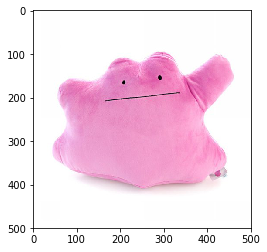

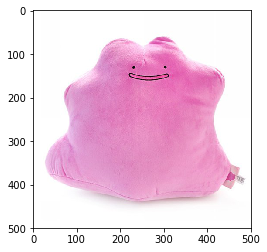

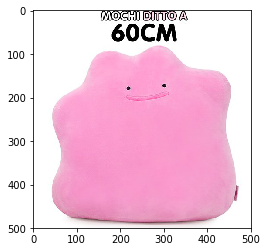

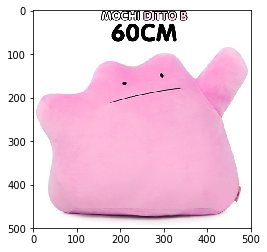

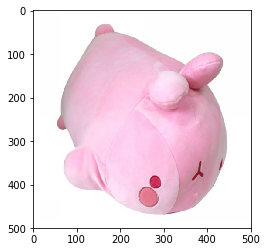

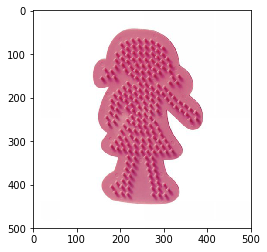

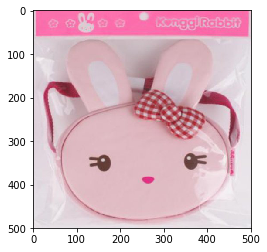

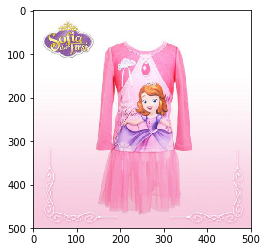

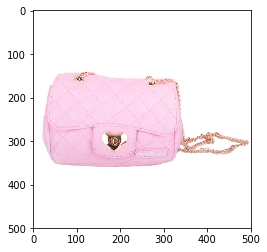

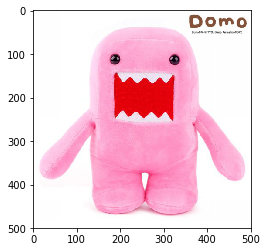

In [22]:
# 전체 상위 10개
for file in cossim_highest_ten_l:
    process(file)

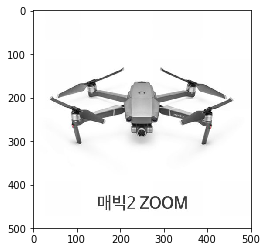

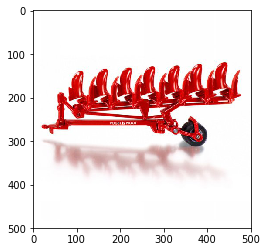

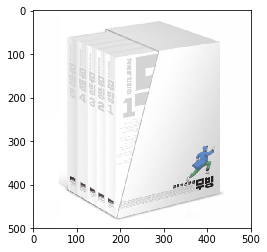

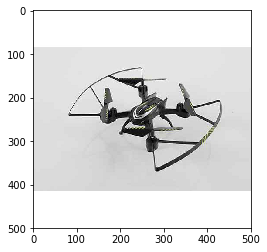

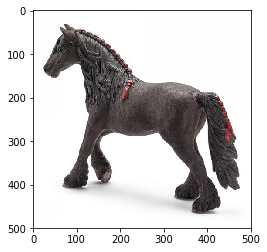

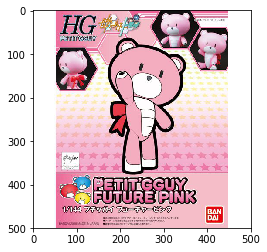

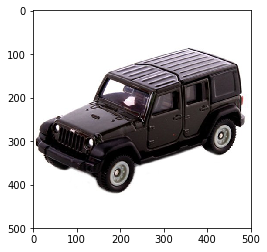

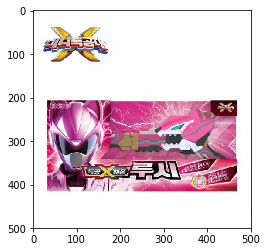

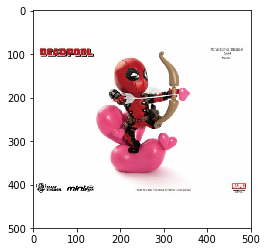

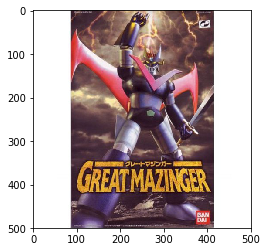

In [23]:
for file in cossim_m_highest_ten_l:
    process(file)

남아 장난감 상위 10개와 비슷한 cossim값을 가지고 있는 (약 0.76~0.84)여아 장난감들을 보기로 한다.

In [24]:
df_f_large = df_female_no_error[(df_female_no_error['cossim'] >= 0.76) & (df_female_no_error['cossim'] <= 0.84)]
df_f_large.shape

(102, 2)

/opt/conda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


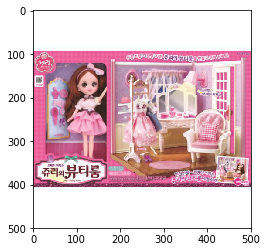

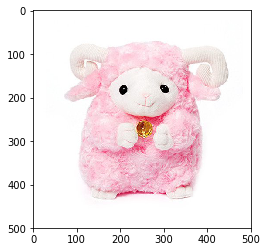

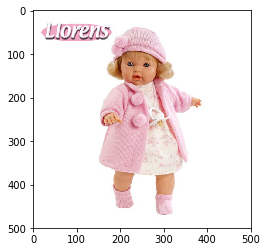

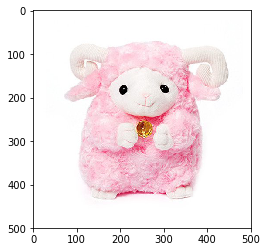

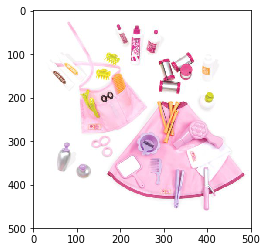

...

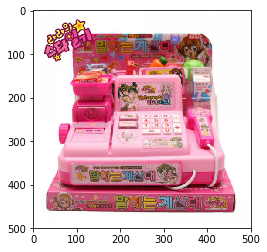

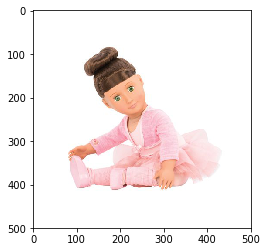

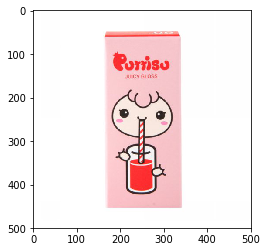

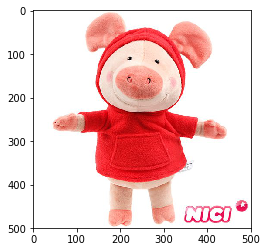

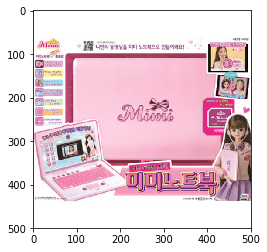

In [25]:
df_f_large_l = df_f_large.파일명.tolist()
for file in df_f_large_l:
    process(file)

빨강 톤이 들어간 장난감들이 있는 것은 비슷한 값의 남아 장난감과 같다. (+보라 계열의 장난감들도 있음)

핑크가 포함되어 있는 무채색의 장난감이 포함되어 있고, 무채색으로만 되어 있는 장난감은 하나 정도 있다.

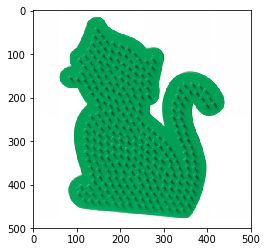

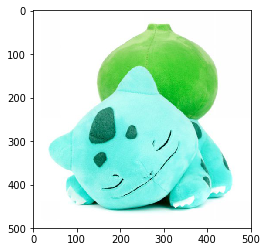

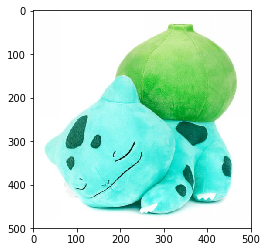

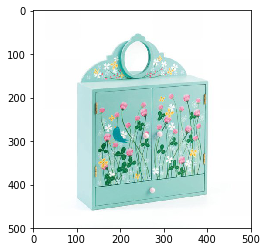

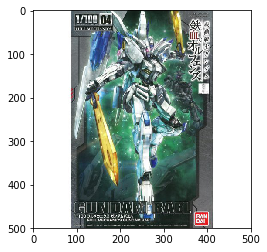

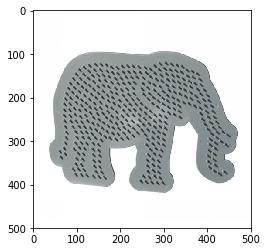

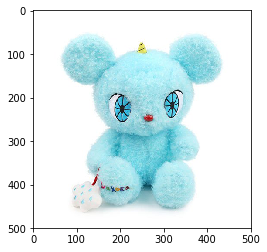

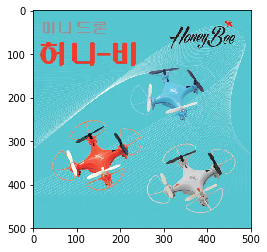

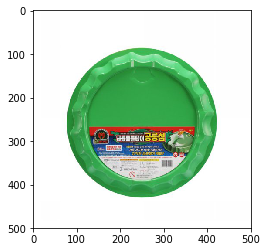

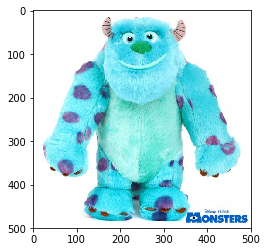

In [26]:
# 전체 하위 10개
for file in cossim_lowest_ten_l:
    process(file)

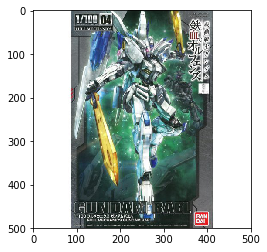

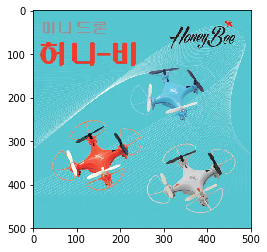

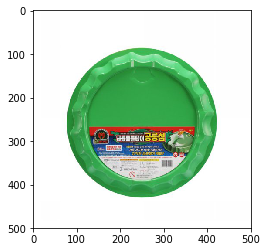

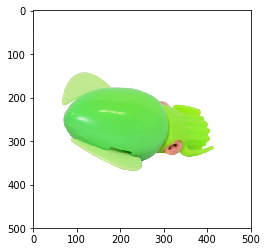

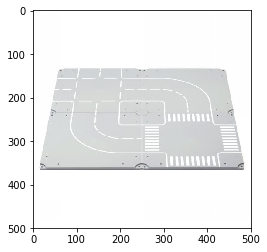

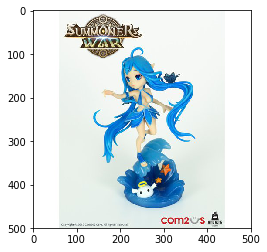

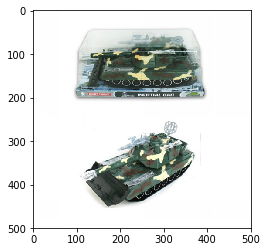

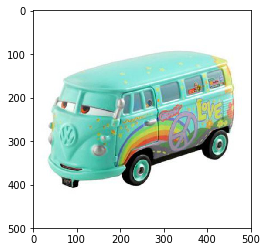

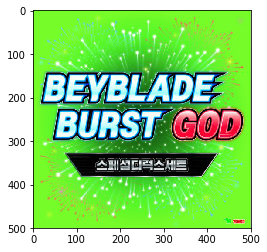

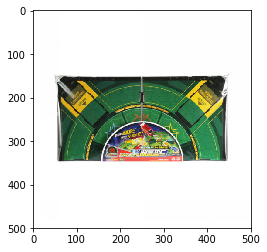

In [27]:
# 남아 하위 10개
for file in cossim_m_lowest_ten_l:
    process(file)

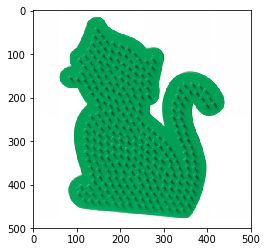

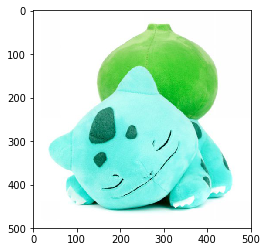

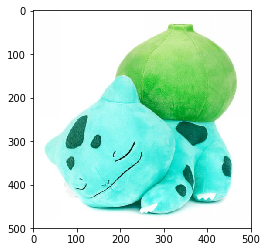

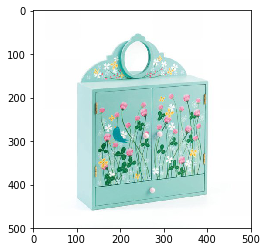

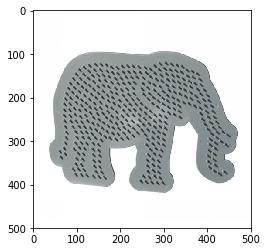

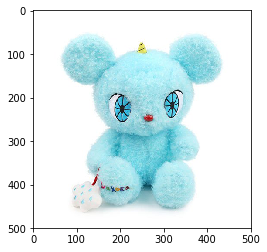

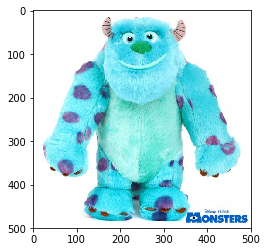

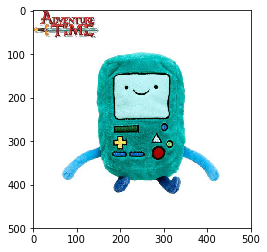

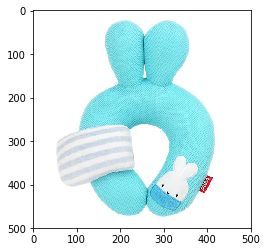

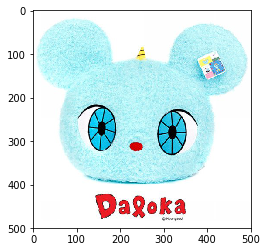

In [28]:
# 여아 하위 10개
for file in cossim_f_lowest_ten_l:
    process(file)

**하위 10개는 그린-옅은 블루-무채색 계열로, 이 점은 여아/남아 둘 다 동일하다.**  

여아 장난감의 하위 10개는 인형이 대부분(7개)인 점이 눈에 띄고,  

남아 장난감은 비교적 다양하다(역할놀이-1, 액션-2, 조종-2, 자동차/기차-3, 프라모델/피규어-2).  

(카테고리 갯수 자체도 남아 장난감이 하나 더 많다)

마찬가지로 blue cossim이 가장 높은 이미지와 가장 낮은 이미지를 뽑아 확인한 결과는 아래와 같다.

In [29]:
# 코드 추가 필요